# Importing Dependencies

## Packages

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go

import numpy as np
import geopandas as gpd
from shapely.geometry import Point
from sklearn.neighbors import BallTree
import math

## Functions

In [2]:
def extract_first_n_digits(number, n):
    cleaned_number = ''.join(filter(str.isdigit, str(number)))
    return int(cleaned_number[:n])

# Apply the function to the 'GEOID' column

In [3]:
def extract_last_n_digits(number, n):
    return int(str(number)[-n:])
def extract_first_n_digits(number, n):
    return int(str(number)[:n])
def order_of_magnitude_digits(number):
    return len(str(abs(number))) - 1

In [117]:
from shapefile_to_dataframe import shapefile_to_dataframe

## References

CATS - https://github.com/WISPO-POP/CATS-CaliforniaTestSystem

CalEnviroScreen 4.0 - https://oehha.ca.gov/calenviroscreen/report/calenviroscreen-40

Building Groups (census.gov) - https://www.census.gov/cgi-bin/geo/shapefiles/index.php?year=2023&layergroup=Census+Tracts

## File inputs

In [4]:
bus = pd.read_csv('/Users/melek/CATS-CaliforniaTestSystem/GIS/CATS_buses.csv')
branches = pd.read_csv('/Users/melek/CATS-CaliforniaTestSystem/MATPOWER/branch.csv')
CalEnv= pd.read_excel('/Users/melek/Desktop/Research/Research_Winter_2024/Data/calenviroscreen40resultsdatadictionaryf2021/calenviroscreen40resultsdatadictionary_F_2021.xlsx')
Generators = pd.read_csv('/Users/melek/CATS-CaliforniaTestSystem/GIS/CATS_gens.csv')
combined_bg = pd.read_csv('/Users/melek/Desktop/Research/Research_Winter_2024/Data/BG_CA_AR_OR_NV.csv')
lmi = pd.read_csv('/Users/melek/Desktop/Research/Research_Winter_2024/Data/QUALIFIED_CENSUS_TRACTS_7550712274357692691.csv',low_memory=False)
EJScreen = pd.read_csv('/Users/melek/Desktop/Research/Research_Winter_2024/Data/EJSCREEN_2023_Tracts_StatePct_with_AS_CNMI_GU_VI.csv',low_memory=False)
# lmi = lmi[lmi['STATE']==6].reset_index(drop=True).drop('OBJECTID',axis=1)
# display(lmi)
# display(bus)
# display(branches)
# display(CalEnv)

In [5]:
pd.set_option('display.max_columns', None)  # Display all columns without truncation
# display((EJScreen[EJScreen['ST_ABBREV']=='CA']))

,OID_,ID,STATE_NAME,ST_ABBREV,CNTY_NAME,REGION,ACSTOTPOP,ACSIPOVBAS,ACSEDUCBAS,ACSTOTHH,ACSTOTHU,ACSUNEMPBAS,DEMOGIDX_2,DEMOGIDX_5,PEOPCOLOR,PEOPCOLORPCT,LOWINCOME,LOWINCPCT,UNEMPLOYED,UNEMPPCT,LINGISO,LINGISOPCT,LESSHS,LESSHSPCT,UNDER5,UNDER5PCT,OVER64,OVER64PCT,LIFEEXPPCT,PM25,OZONE,DSLPM,CANCER,RESP,RSEI_AIR,PTRAF,PRE1960,PRE1960PCT,PNPL,PRMP,PTSDF,UST,PWDIS,D2_PM25,D5_PM25,D2_OZONE,D5_OZONE,D2_DSLPM,D5_DSLPM,D2_CANCER,D5_CANCER,D2_RESP,D5_RESP,D2_RSEI_AIR,D5_RSEI_AIR,D2_PTRAF,D5_PTRAF,D2_LDPNT,D5_LDPNT,D2_PNPL,D5_PNPL,D2_PRMP,D5_PRMP,D2_PTSDF,D5_PTSDF,D2_UST,D5_UST,D2_PWDIS,D5_PWDIS,P_DEMOGIDX_2,P_DEMOGIDX_5,P_PEOPCOLORPCT,P_LOWINCPCT,P_UNEMPPCT,P_LINGISOPCT,P_LESSHSPCT,P_UNDER5PCT,P_OVER64PCT,P_LIFEEXPPCT,P_PM25,P_OZONE,P_DSLPM,P_CANCER,P_RESP,P_RSEI_AIR,P_PTRAF,P_LDPNT,P_PNPL,P_PRMP,P_PTSDF,P_UST,P_PWDIS,P_D2_PM25,P_D5_PM25,P_D2_OZONE,P_D5_OZONE,P_D2_DSLPM,P_D5_DSLPM,P_D2_CANCER,P_D5_CANCER,P_D2_RESP,P_D5_RESP,P_D2_RSEI_AIR,P_D5_RSEI_AIR,P_D2_PTRAF,P_D5_PTRAF,P_D2_LDPNT,P_D5_LDPNT,P_D2_PNPL,P_D5_PNPL,P_D2_PRMP,P_D5_PRMP,P_D2_PTSDF,P_D5_PTSDF,P_D2_UST,P_D5_UST,P_D2_PWDIS,P_D5_PWDIS,AREALAND,AREAWATER,NPL_CNT,TSDF_CNT,EXCEED_COUNT_80,EXCEED_COUNT_80_SUP,Shape_Length,Shape_Area
4202,4203,6001400100,California,CA,Alameda,9,3324.0,3313.0,2513.0,1337.0,1478.0,1770.0,0.203550,0.057783,991.0,0.298135,361.0,0.108965,66.0,0.037288,8.0,0.005984,78.0,0.031039,121.0,0.036402,801.0,0.240975,0.105641,8.012015,50.77985,0.227058,20.0,0.2,693.848640,529.024536,204.0,0.138024,0.118865,0.175298,5.085212,0.000000,0.010337,7.938440,2.253545,1.424848,0.404482,9.363288,2.658027,0.610649,0.173350,0.407099,0.115566,13.637832,3.871474,15.062680,4.275957,7.938440,2.253545,13.027183,3.698125,8.345539,2.369111,11.398785,3.235859,0.000000,0.000000,9.973937,2.831377,9.0,4.0,13.0,15.0,24.0,11.0,15.0,22.0,88.0,1.0,39.0,7.0,46.0,3.0,2.0,67.0,74.0,39.0,64.0,41.0,56.0,0.0,49.0,23.0,22.0,5.0,4.0,28.0,26.0,8.0,5.0,4.0,2.0,37.0,34.0,39.0,36.0,24.0,21.0,37.0,34.0,26.0,23.0,32.0,29.0,0.0,0.0,29.0,25.0,6945856.0,0.0,0,0,0,0.0,0.143536,0.000711
4203,4204,6001400200,California,CA,Alameda,9,2038.0,2038.0,1621.0,868.0,908.0,1181.0,0.188665,0.065877,592.0,0.290481,177.0,0.086850,85.0,0.071973,4.0,0.004608,3.0,0.001851,161.0,0.078999,474.0,0.232581,0.164103,8.012618,50.10694,0.351369,20.0,0.3,722.383435,2154.858727,768.0,0.845815,0.156685,0.237986,11.567994,9.974813,0.007016,7.357949,2.569198,1.131992,0.395261,13.583906,4.743134,0.565996,0.197631,3.207311,1.119907,12.829244,4.479627,17.923209,6.258302,18.489205,6.455933,14.149902,4.940765,9.999264,3.491474,16.036555,5.599534,18.111874,6.324179,8.867272,3.096213,7.0,8.0,13.0,10.0,63.0,9.0,0.0,79.0,87.0,35.0,39.0,6.0,72.0,3.0,17.0,68.0,95.0,98.0,75.0,53.0,85.0,96.0,47.0,21.0,25.0,4.0,4.0,37.0,41.0,7.0,8.0,20.0,21.0,35.0,39.0,45.0,50.0,49.0,50.0,40.0,44.0,29.0,32.0,42.0,46.0,67.0,67.0,26.0,28.0,586560.0,0.0,0,0,0,0.0,0.041978,0.000060
4204,4205,6001400300,California,CA,Alameda,9,5449.0,5410.0,4358.0,2548.0,2779.0,3474.0,0.254927,0.071190,2192.0,0.402276,582.0,0.107579,129.0,0.037133,134.0,0.052590,231.0,0.053006,98.0,0.017985,973.0,0.178565,0.105641,8.007085,49.89648,0.366623,20.0,0.3,691.868198,1847.387166,1816.0,0.653472,0.185614,0.242249,13.175562,5.209840,0.006151,9.942157,2.776401,1.274636,0.355949,19.119533,5.339232,0.764781,0.213569,4.333761,1.210226,17.080116,4.769714,23.708221,6.620648,22.433585,6.264699,20.649095,5.766371,13.511136,3.773057,22.688512,6.335889,23.198366,6.478268,11.726647,3.274729,17.0,11.0,24.0,14.0,24.0,45.0,26.0,7.0,70.0,1.0,39.0,5.0,75.0,3.0,17.0,67.0,93.0,88.0,81.0,53.0,89.0,91.0,46.0,29.0,27.0,4.0,4.0,48.0,45.0,12.0,10.0,24.0,22.0,44.0,41.0,56.0,52.0,56.0,49.0,52.0,49.0,37.0,34.0,54.0,51.0,70.0,68.0,34.0,29.0,1110840.0,0.0,0,0,0,0.0,0.055377,0.000114
4205,4206,6001400400,California,CA,Alameda,9,4384.0,4384.0,3333.0,1826.0,1986.0,2687.0,0.241218,0.067110,1477.0,0.336907,638.0,0.145529,26.0,0.009676,0.0,0.000000,102.0,0.030603,294.0,0.067062,532.0,0.121350,0.149744,8.033864,49.86804,0.359243,

# Data Processing

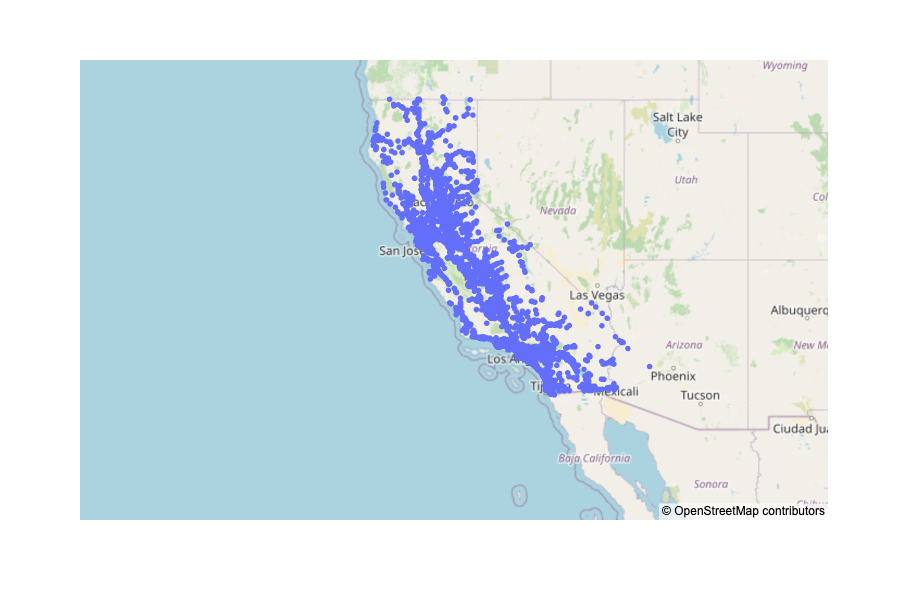

In [6]:
fig = px.scatter_mapbox(bus,
                         lat="Lat",
                         lon="Lon",
                         zoom=4)
fig.update_layout(mapbox_style="open-street-map",
                  width=1200,  # Adjust width as needed
                  height=600) 
fig.show()

## Cencus tract mapping

## Old code (using CalEnv)

In [7]:
# CATS_nodes = gpd.GeoDataFrame({
#         'geometry': Point(a,b),
#         'x': a,
#         'y': b,
#     } for a, b in zip(np.array(bus['Lat']),np.array(bus['Lon']))
# )
# CalEnv_nodes = gpd.GeoDataFrame([{
#         'geometry': Point(a,b),
#         'x': a,
#         'y': b,
#     } for a, b in zip(np.array(CalEnv['Latitude']),np.array(CalEnv['Longitude']))
# ])
# # Create a BallTree 
# tree = BallTree(CalEnv_nodes[['x', 'y']].values, leaf_size=2)

# # Query the BallTree on each feature from 'appart' to find the distance
# # to the nearest 'pharma' and its id
# CATS_nodes['distance_nearest'], CATS_nodes['id_nearest'] = tree.query(
#     CATS_nodes[['x', 'y']].values, # The input array for the query
#     k=1, # The number of nearest neighbors
# )
# # CATS_nodes['ZipCode'] = CATS_nodes['id_nearest'].apply(lambda x: CalEnv['ZIP'][x])
# # CATS_nodes['CensusTract'] = CATS_nodes['id_nearest'].apply(lambda x: CalEnv['Census Tract'][x])

# for i in CalEnv.keys():
#     CATS_nodes[i] = CATS_nodes['id_nearest'].apply(lambda x: CalEnv[i][x])

# display(CATS_nodes)

In [8]:
CalEnvCols = [
#     'Total Population',
    'CES 4.0 Percentile',
#     'Ozone Pctl',
#     'PM2.5 Pctl',
#     'Diesel PM Pctl',
#     'Drinking Water Pctl',
#     'Lead Pctl',
#     'Pesticides Pctl',
#     'Tox. Release Pctl',
#     'Traffic Pctl',
#     'Cleanup Sites Pctl',
#     'Groundwater Threats Pctl',
    'Haz. Waste Pctl',
#     'Imp. Water Bodies Pctl',
#     'Solid Waste Pctl',
    'Pollution Burden Pctl',
    'Asthma Pctl',
#     'Low Birth Weight Pctl',
#     'Cardiovascular Disease Pctl',
#     'Education Pctl',
#     'Linguistic Isolation Pctl',
    'Poverty Pctl',
#     'Unemployment Pctl',
    'Housing Burden Pctl',
#     'Pop. Char. Pctl',
]

## Mapping (Cencus Bureau)

In [9]:
Gen_nodes = gpd.GeoDataFrame({
        'geometry': Point(a,b),
        'x': a,
        'y': b,
    } for a, b in zip(np.array(Generators['Lat']),np.array(Generators['Lon']))
)
combined_bg_nodes= gpd.GeoDataFrame([{
        'geometry': Point(a,b),
        'x': a,
        'y': b,
    } for a, b in zip(np.array(combined_bg['INTPTLAT']),np.array(combined_bg['INTPTLON']))
])
# Create a BallTree 
tree = BallTree(combined_bg_nodes[['x', 'y']].values, leaf_size=2)

# Query the BallTree on each feature from 'appart' to find the distance
# to the nearest 'pharma' and its id
Gen_nodes[Generators.columns]=Generators[Generators.columns]
Gen_nodes['distance_nearest'], Gen_nodes['id_nearest'] = tree.query(
    Gen_nodes[['x', 'y']].values, # The input array for the query
    k=1, # The number of nearest neighbors
)
for i in combined_bg.keys():
    Gen_nodes[i] = Gen_nodes['id_nearest'].apply(lambda x: combined_bg[i][x])

# print(Gen_nodes.columns)
Gen_nodes = Gen_nodes.drop(['PlantCode', 'GenID','BLKGRPCE','id_nearest','Unnamed: 0','NAMELSAD', 'MTFCC', 'GEOIDFQ',
       'FUNCSTAT', 'ALAND', 'AWATER','Lat', 'Lon'],axis=1)
print(Gen_nodes.columns)

display(Gen_nodes)

Index(['geometry', 'x', 'y', 'bus', 'FuelType', 'Pg', 'Pmax', 'Pmin', 'Qg',
       'Qmax', 'Qmin', 'distance_nearest', 'STATEFP', 'COUNTYFP', 'TRACTCE',
       'GEOID', 'INTPTLAT', 'INTPTLON'],
      dtype='object')


,geometry,x,y,bus,FuelType,Pg,Pmax,Pmin,Qg,Qmax,Qmin,distance_nearest,STATEFP,COUNTYFP,TRACTCE,GEOID,INTPTLAT,INTPTLON
0,POINT (39.134 -120.953),39.134259,-120.953341,745,Conventional Hydroelectric,4.033363,12.1,0,0,18.777143,-14.670714,0.020368,6,61,22002,60610220021,39.114750,-120.959196
1,POINT (37.629 -120.931),37.629360,-120.931390,1804,Petroleum Liquids,0.000000,71.2,0,0,34.500000,-23.700000,0.006357,6,99,2002,60990020023,37.628168,-120.925146
2,POINT (37.629 -120.931),37.629360,-120.931390,1804,Natural Gas Fired Combustion Turbine,0.000000,71.2,0,0,34.500000,-23.700000,0.006357,6,99,2002,60990020023,37.628168,-120.925146
3,POINT (37.611 -120.595),37.611461,-120.594678,1964,Conventional Hydroelectric,0.366669,1.1,0,0,18.777143,-14.670714,0.023072,6,99,2901,60990029011,37.600803,-120.574215
4,POINT (37.611 -120.595),37.611461,-120.594678,1964,Conventional Hydroelectric,0.366669,1.1,0,0,18.777143,-14.670714,0.023072,6,99,2901,60990029011,37.600803,-120.574215
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3887,POINT (32.697 -117.143),32.696514,-117.143455,8862,Synchronous Condenser,0.000000,0.0,0,0,200.000000,-200.000000,0.004024,6,73,5000,60730050001,32.692529,-117.144019
3888,POINT (34.367 -117.369),34.366663,-117.368629,8863,Synchronous Condenser,0.000000,0.0,0,0,200.000000,-200.000000,0.022798,6,71,10034,60710100343,34.356539,-117.389055
3889,POINT (34.367 -117.369),34.366600,-117.368612,8864,Synchronous Condenser,0.000000,0.0,0,0,200.000000,-200.000000,0.022786,6,71,10034,60710100343,34.356539,-117.389055
3890,POINT (35.842 -119.085),35.841706,-119.085033,8865,Synchronous Condenser,0.000000,0.0,0,0,200.000000,-200.000000,0.046688,6,107,4301,61070043012,35.797477,-119.099987


## Additional data

### From CATS

#### generator data

In [10]:
# Create a mapping of FuelType categories to broader types
type_mapping = {
    'All Other': 'Other',
    'Batteries': 'Battery',
    'Conventional Hydroelectric': 'Hydroelectric',
    'Conventional Steam Coal': 'Coal',
    'Geothermal': 'Geothermal',
    'Hydroelectric Pumped Storage': 'Hydroelectric',
    'IMPORT': 'IMPORT',
    'Landfill Gas': 'Gas',
    'Municipal Solid Waste': 'Waste',
    'Natural Gas Fired Combined Cycle': 'Gas',
    'Natural Gas Fired Combustion Turbine': 'Gas',
    'Natural Gas Internal Combustion Engine': 'Gas',
    'Natural Gas Steam Turbine': 'Gas',
    'Nuclear': 'Nuclear',
    'Onshore Wind Turbine': 'Wind',
    'Other Gases': 'Gas',
    'Other Natural Gas': 'Gas',
    'Other Waste Biomass': 'Waste',
    'Petroleum Coke': 'Coal',
    'Petroleum Liquids': 'Oil',
    'Solar Photovoltaic': 'Solar',
    'Solar Thermal without Energy Storage': 'Solar',
    'Synchronous Condenser': 'Sync',
    'Wood/Wood Waste Biomass': 'Waste'
}

# Apply the mapping to create the 'Type' column
Gen_nodes['Type'] = Gen_nodes['FuelType'].map(type_mapping)

# display(Generators)

In [11]:
agg_funcs = {
    'geometry': 'first',
    'x': 'first',
    'y': 'first',
    'FuelType': 'sum',
    'Pg': 'sum',
    'Pmax': 'sum',
    'Pmin': 'sum',
    'Qg': 'sum',
    'Qmax': 'sum',
    'Qmin': 'sum',
    'Type': 'first',
    'distance_nearest': 'first',
    'STATEFP': 'first',
    'COUNTYFP': 'first',
    'TRACTCE': 'first',
    'GEOID': 'first',
    'INTPTLAT': 'first',
    'INTPTLON': 'first'
}

Gen_nodes_unique = Gen_nodes.groupby('bus').agg(agg_funcs).reset_index()


# Set the index to 'bus'
Gen_nodes_unique.set_index('bus', inplace=True)

generator_types = np.unique(Gen_nodes_unique['Type'])
Gen_nodes_unique[generator_types] = Gen_nodes_unique.groupby(['bus', 'Type']).size().unstack(fill_value=0)


# Rename FuelType column to indicate it's a tally
# Gen_nodes_unique.rename(columns={'FuelType': 'FuelType_tally'}, inplace=True)
Gen_nodes_unique = Gen_nodes_unique.drop('FuelType',axis=1)
Gen_nodes = Gen_nodes_unique
# Print or use Gen_nodes_unique as needed
display(Gen_nodes)

,geometry,x,y,Pg,Pmax,Pmin,Qg,Qmax,Qmin,Type,distance_nearest,STATEFP,COUNTYFP,TRACTCE,GEOID,INTPTLAT,INTPTLON,Battery,Coal,Gas,Geothermal,Hydroelectric,IMPORT,Nuclear,Oil,Other,Solar,Sync,Waste,Wind
bus,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,POINT (37.772 -122.243),37.772436,-122.242916,0.000000,0.00000,0,0,200.000000,-200.000000,Sync,0.003468,6,1,427200,60014272001,37.769139,-122.241840,0,0,0,0,0,0,0,0,0,0,1,0,0
4,POINT (37.691 -122.061),37.691281,-122.061277,0.000000,0.00000,0,0,200.000000,-200.000000,Sync,0.006874,6,1,430800,60014308003,37.698087,-122.060316,0,0,0,0,0,0,0,0,0,0,1,0,0
5,POINT (37.596 -122.017),37.595782,-122.017435,0.000000,0.00000,0,0,200.000000,-200.000000,Sync,0.004372,6,1,440200,60014402001,37.599759,-122.019253,0,0,0,0,0,0,0,0,0,0,1,0,0
6,POINT (40.094 -123.509),40.094100,-123.508983,1.633345,4.90000,0,0,18.777143,-14.670714,Hydroelectric,0.131814,6,23,11600,60230116005,40.089302,-123.640709,0,0,0,0,1,0,0,0,0,0,0,0,0
7,POINT (37.557 -122.058),37.556992,-122.057940,0.000000,0.00000,0,0,200.000000,-200.000000,Sync,0.003851,6,1,441503,60014415033,37.560586,-122.059324,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8862,POINT (32.697 -117.143),32.696514,-117.143455,0.000000,0.00000,0,0,200.000000,-200.000000,Sync,0.004024,6,73,5000,60730050001,32.692529,-117.144019,0,0,0,0,0,0,0,0,0,0,1,0,0
8863,POINT (34.367 -117.369),34.366663,-117.368629,0.000000,0.00000,0,0,200.000000,-200.000000,Sync,0.022798,6,71,10034,60710100343,34.356539,-117.389055,0,0,0,0,0,0,0,0,0,0,1,0,0
8864,POINT (34.367 -117.369),34.366600,-117.368612,0.000000,0.00000,0,0,200.000000,-200.000000,Sync,0.022786,6,71,10034,60710100343,34.356539,-117.389055,0,0,0,0,0,0,0,0,0,0,1,0,0


#### bus data

In [73]:
Gen_nodes['kV'] = bus['kV']
Gen_nodes['Type'] = bus ['Type']
Gen_nodes['Import'] = bus['Import'].apply(lambda x: 1 if x.strip().upper() == "'IMPORT'" else 0)

### EPA

#### EJScreen Columns

OID_
ID
STATE_NAME
ST_ABBREV
CNTY_NAME
REGION
ACSTOTPOP
ACSIPOVBAS
ACSEDUCBAS
ACSTOTHH
ACSTOTHU
ACSUNEMPBAS
DEMOGIDX_2
DEMOGIDX_5
PEOPCOLOR
PEOPCOLORPCT
LOWINCOME
LOWINCPCT
UNEMPLOYED
UNEMPPCT
LINGISO
LINGISOPCT
LESSHS
LESSHSPCT
UNDER5
UNDER5PCT
OVER64
OVER64PCT
LIFEEXPPCT
PM25
OZONE
DSLPM
CANCER
RESP
RSEI_AIR
PTRAF
PRE1960
PRE1960PCT
PNPL
PRMP
PTSDF
UST
PWDIS
D2_PM25
D5_PM25
D2_OZONE
D5_OZONE
D2_DSLPM
D5_DSLPM
D2_CANCER
D5_CANCER
D2_RESP
D5_RESP
D2_RSEI_AIR
D5_RSEI_AIR
D2_PTRAF
D5_PTRAF
D2_LDPNT
D5_LDPNT
D2_PNPL
D5_PNPL
D2_PRMP
D5_PRMP
D2_PTSDF
D5_PTSDF
D2_UST
D5_UST
D2_PWDIS
D5_PWDIS
P_DEMOGIDX_2
P_DEMOGIDX_5
P_PEOPCOLORPCT
P_LOWINCPCT
P_UNEMPPCT
P_LINGISOPCT
P_LESSHSPCT
P_UNDER5PCT
P_OVER64PCT
P_LIFEEXPPCT
P_PM25
P_OZONE
P_DSLPM
P_CANCER
P_RESP
P_RSEI_AIR
P_PTRAF
P_LDPNT
P_PNPL
P_PRMP
P_PTSDF
P_UST
P_PWDIS
P_D2_PM25
P_D5_PM25
P_D2_OZONE
P_D5_OZONE
P_D2_DSLPM
P_D5_DSLPM
P_D2_CANCER
P_D5_CANCER
P_D2_RESP
P_D5_RESP
P_D2_RSEI_AIR
P_D5_RSEI_AIR
P_D2_PTRAF
P_D5_PTRAF
P_D2_LDPNT
P_D5_LDPNT
P_D2_PNPL
P_D5_PNPL
P_D2_PRMP
P_D5_PRMP
P_D2_PTSDF
P_D5_PTSDF
P_D2_UST
P_D5_UST
P_D2_PWDIS
P_D5_PWDIS
AREALAND
AREAWATER
NPL_CNT
TSDF_CNT
EXCEED_COUNT_80
EXCEED_COUNT_80_SUP
Shape_Length
Shape_Area

In [74]:

Gen_nodes['First_10_Digits'] = Gen_nodes['GEOID'].apply(lambda x: extract_first_n_digits(x, 10))       

EJScreenCols = EJScreen.columns

# First, create a temporary DataFrame to store the updated columns
temp_df = pd.DataFrame(index=Gen_nodes.index, columns=EJScreenCols)
# Iterate over Gen_nodes index
for i in Gen_nodes.index:
    if Gen_nodes['First_10_Digits'][i] in EJScreen['ID'].values:
        idx = EJScreen['ID'] == Gen_nodes['First_10_Digits'][i]
        temp_df.loc[i, EJScreenCols] = EJScreen.loc[idx, EJScreenCols].values[0]

# Update Gen_nodes with the values from temp_df
Gen_nodes[EJScreenCols] = temp_df

### Census Bureau

### HUD

In [91]:
Gen_nodes['IsLMI'] = 0  # Initialize as False
# Loop through each Census Tract in CATS_nodes
for i in Gen_nodes.index:
    if Gen_nodes['First_10_Digits'][i] in lmi['GEOID'].values:
        Gen_nodes.loc[i, 'IsLMI'] = 1  # Update IsLMI to True if it's in LMI

### CalEnviroScreen

In [76]:
# Gen_nodes['First_10_Digits'] = Gen_nodes['GEOID'].apply(lambda x: extract_first_n_digits(x, 10))        
# Gen_nodes[CalEnvCols] = np.nan
# for i in Gen_nodes.index:
#     if Gen_nodes['First_10_Digits'][i] in CalEnv['Census Tract'].values:
#         # CATS_nodes.loc[i, CalEnvCols] = CalEnv.loc[CalEnv['Census Tract']==CATS_nodes['First_10_Digits'][i], CalEnvCols]  # Update IsLMI to True if it's in LMI
#         # CATS_nodes[CalEnvCols][i] = CalEnv[CalEnv['Census Tract']==CATS_nodes['First_10_Digits'][i]][CalEnvCols]
#         idx = CalEnv['Census Tract'] == Gen_nodes['First_10_Digits'][i]
#         Gen_nodes.loc[i, CalEnvCols] = CalEnv.loc[idx, CalEnvCols].values[0]

## Final DF

In [77]:
display(Gen_nodes)

,geometry,x,y,Pg,Pmax,Pmin,Qg,Qmax,Qmin,Type,distance_nearest,STATEFP,COUNTYFP,TRACTCE,GEOID,INTPTLAT,INTPTLON,Battery,Coal,Gas,Geothermal,Hydroelectric,IMPORT,Nuclear,Oil,Other,Solar,Sync,Waste,Wind,kV,Import,First_10_Digits,OID_,ID,STATE_NAME,ST_ABBREV,CNTY_NAME,REGION,ACSTOTPOP,ACSIPOVBAS,ACSEDUCBAS,ACSTOTHH,ACSTOTHU,ACSUNEMPBAS,DEMOGIDX_2,DEMOGIDX_5,PEOPCOLOR,PEOPCOLORPCT,LOWINCOME,LOWINCPCT,UNEMPLOYED,UNEMPPCT,LINGISO,LINGISOPCT,LESSHS,LESSHSPCT,UNDER5,UNDER5PCT,OVER64,OVER64PCT,LIFEEXPPCT,PM25,OZONE,DSLPM,CANCER,RESP,RSEI_AIR,PTRAF,PRE1960,PRE1960PCT,PNPL,PRMP,PTSDF,UST,PWDIS,D2_PM25,D5_PM25,D2_OZONE,D5_OZONE,D2_DSLPM,D5_DSLPM,D2_CANCER,D5_CANCER,D2_RESP,D5_RESP,D2_RSEI_AIR,D5_RSEI_AIR,D2_PTRAF,D5_PTRAF,D2_LDPNT,D5_LDPNT,D2_PNPL,D5_PNPL,D2_PRMP,D5_PRMP,D2_PTSDF,D5_PTSDF,D2_UST,D5_UST,D2_PWDIS,D5_PWDIS,P_DEMOGIDX_2,P_DEMOGIDX_5,P_PEOPCOLORPCT,P_LOWINCPCT,P_UNEMPPCT,P_LINGISOPCT,P_LESSHSPCT,P_UNDER5PCT,P_OVER64PCT,P_LIFEEXPPCT,P_PM25,P_OZONE,P_DSLPM,P_CANCER,P_RESP,P_RSEI_AIR,P_PTRAF,P_LDPNT,P_PNPL,P_PRMP,P_PTSDF,P_UST,P_PWDIS,P_D2_PM25,P_D5_PM25,P_D2_OZONE,P_D5_OZONE,P_D2_DSLPM,P_D5_DSLPM,P_D2_CANCER,P_D5_CANCER,P_D2_RESP,P_D5_RESP,P_D2_RSEI_AIR,P_D5_RSEI_AIR,P_D2_PTRAF,P_D5_PTRAF,P_D2_LDPNT,P_D5_LDPNT,P_D2_PNPL,P_D5_PNPL,P_D2_PRMP,P_D5_PRMP,P_D2_PTSDF,P_D5_PTSDF,P_D2_UST,P_D5_UST,P_D2_PWDIS,P_D5_PWDIS,AREALAND,AREAWATER,NPL_CNT,TSDF_CNT,EXCEED_COUNT_80,EXCEED_COUNT_80_SUP,Shape_Length,Shape_Area,IsLMI
bus,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,POINT (37.772 -122.243),37.772436,-122.242916,0.000000,0.00000,0,0,200.000000,-200.000000,'Substation',0.003468,6,1,427200,60014272001,37.769139,-122.241840,0,0,0,0,0,0,0,0,0,0,1,0,0,66,0,6001427200,4364,6001427200,California,CA,Alameda,9,4418.0,4287.0,3152.0,1582.0,1706.0,2557.0,0.453961,0.13138,2959.0,0.66976,1021.0,0.238162,131.0,0.051232,79.0,0.049937,432.0,0.137056,301.0,0.06813,520.0,0.1177,0.180513,7.755535,50.04061,0.305864,20.0,0.3,387.268403,238.873416,1160.0,0.679953,0.192411,0.267935,6.924065,13.827871,0.000013,15.888634,4.598295,2.723766,0.788279,28.599542,8.27693,1.361883,0.39414,7.717337,2.233457,25.875776,7.488651,23.605971,6.831752,40.402527,11.692807,36.770839,10.641768,25.421815,7.357272,30.415386,8.80245,44.488176,12.875225,4.53961,1.313798,51.0,47.0,52.0,46.0,40.0,43.0,55.0,68.0,39.0,56.0,35.0,6.0,63.0,3.0,17.0,57.0,52.0,89.0,81.0,56.0,67.0,98.0,10.0,44.0,41.0,10.0,9.0,64.0,61.0,28.0,26.0,40.0,39.0,61.0,58.0,56.0,53.0,78.0,72.0,73.0,70.0,58.0,55.0,67.0,64.0,85.0,82.0,13.0,12.0,1329667.0,625070.0,0,1,1,1.0,0.075433,0.0002,0
4,POINT (37.691 -122.061),37.691281,-122.061277,0.000000,0.00000,0,0,200.000000,-200.000000,'Substation',0.006874,6,1,430800,60014308003,37.698087,-122.060316,0,0,0,0,0,0,0,0,0,0,1,0,0,115,0,6001430800,4387,6001430800,California,CA,Alameda,9,5652.0,5639.0,4121.0,2083.0,2143.0,3026.0,0.377819,0.110956,3459.0,0.611996,810.0,0.143642,31.0,0.010245,243.0,0.116659,550.0,0.133463,221.0,0.039101,933.0,0.165074,0.150769,7.394651,55.70723,0.246824,20.0,0.3,312.706959,491.658879,1068.0,0.498367,0.043204,0.119817,4.01038,0.962316,0.001269,9.823297,2.884844,5.667287,1.664333,19.268775,5.658732,1.133457,0.332867,6.422925,1.886244,20.024413,5.880643,27.202977,7.988799,28.336434,8.321665,9.823297,2.884844,9.067659,2.662933,17.757499,5.21491,26.825158,7.877843,13.979308,4.105355,38.0,36.0,46.0,24.0,3.0,72.0,54.0,26.0,65.0,21.0,26.0,15.0,51.0,3.0,17.0,53.0,72.0,75.0,26.0,24.0,47.0,71.0,37.0,29.0,27.0,17.0,16.0,49.0,47.0,22.0,21.0,35.0,34.0,51.0,49.0,62.0,60.0,64.0,59.0,30.0,27.0,27.0,25.0,45.0,43.0,73.0,71.0,39.0,36.0,1801249.0,0.0,0,0,0,0.0,0.059452,0.000184,0
5,POINT (37.596 -122.017),37.595782,-122.017435,0.000000,0.00000,0,0,200.000000,-200.000000,'Substation',0.004372,6,1,440200,60014402001,37.599759,-122.019253,0,0,0,0,0,0,0,0,0,0,1,0,0,66,0,6001440200,4462,6001440200,California,CA,Alameda,9,5729.0,5724.0,3678.0,1387.0,1521.0,2979.0

# Correlations

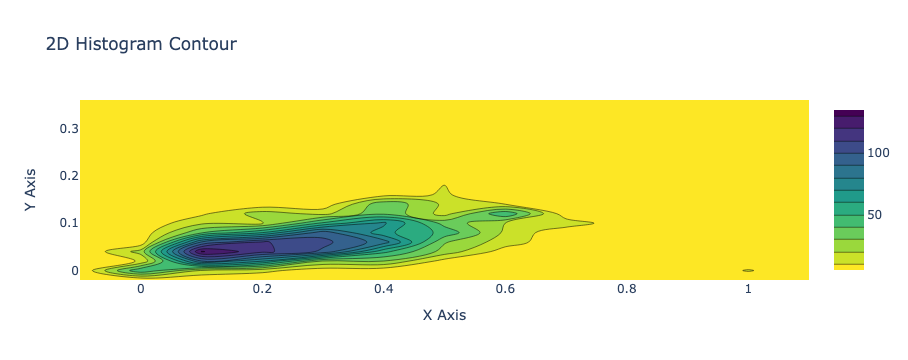

In [18]:
histogram = go.Histogram2dContour(
    x=x,
    y=y,
    colorscale='Viridis',
    reversescale=True,
    xaxis='x',
    yaxis='y'
)

# Create layout for the plot
layout = go.Layout(
    title='2D Histogram Contour',
    xaxis=dict(title='X Axis'),
    yaxis=dict(title='Y Axis'),
)

# Create a figure object
fig = go.Figure(data=[histogram], layout=layout)

# Show the plot
fig.show()

In [106]:
generator_dict = {}

# Loop through each generator type and create a corresponding dataframe
for gen_type in generator_types:
    generator_dict[gen_type.lower() + '_nodes'] = Gen_nodes[Gen_nodes[gen_type] > 0]

## Generator type

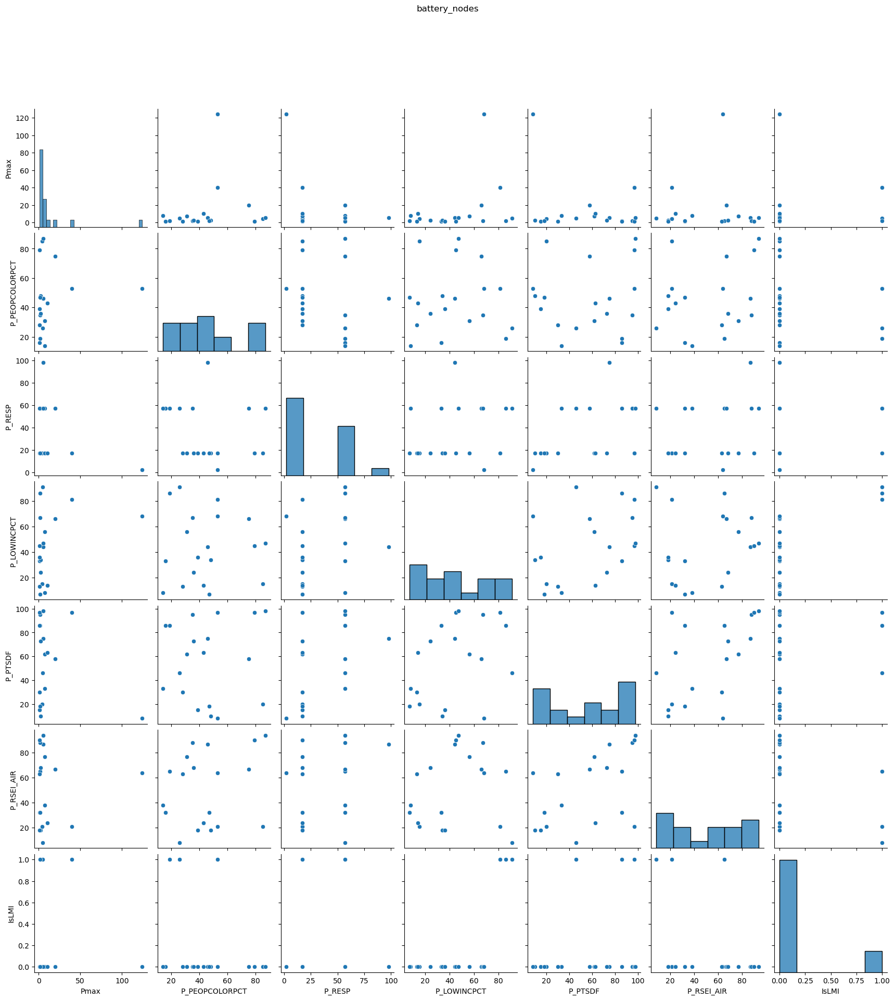

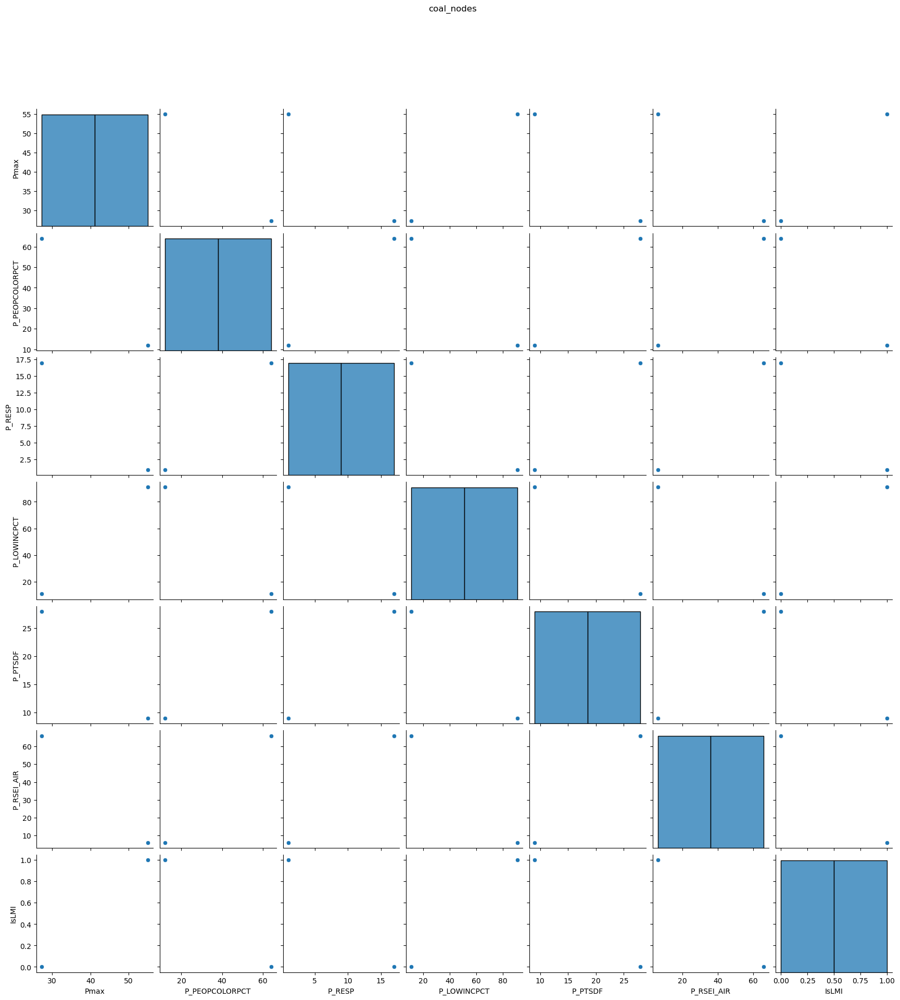

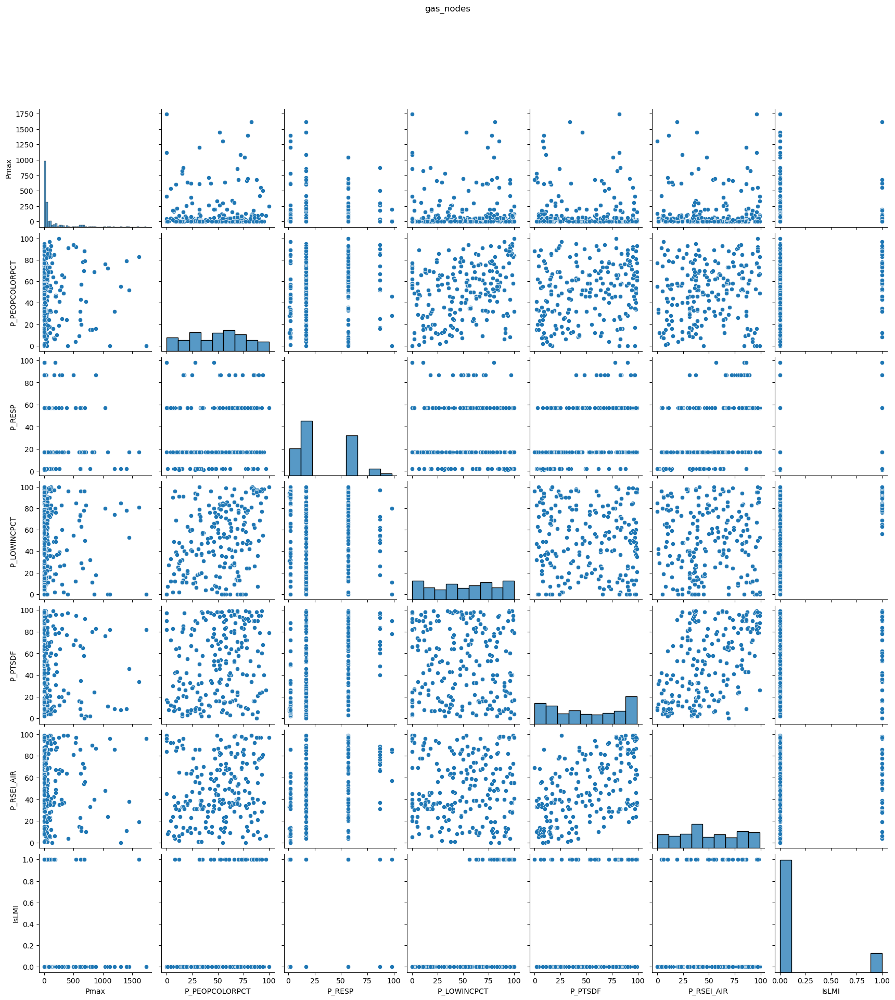

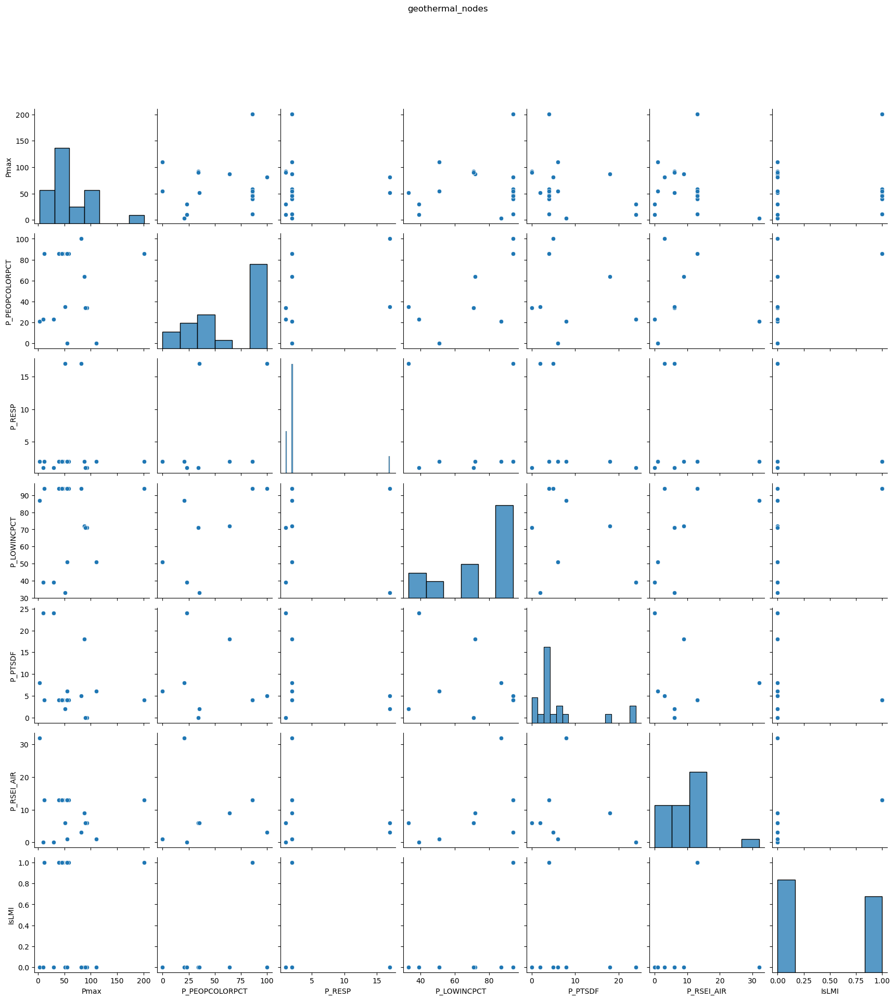

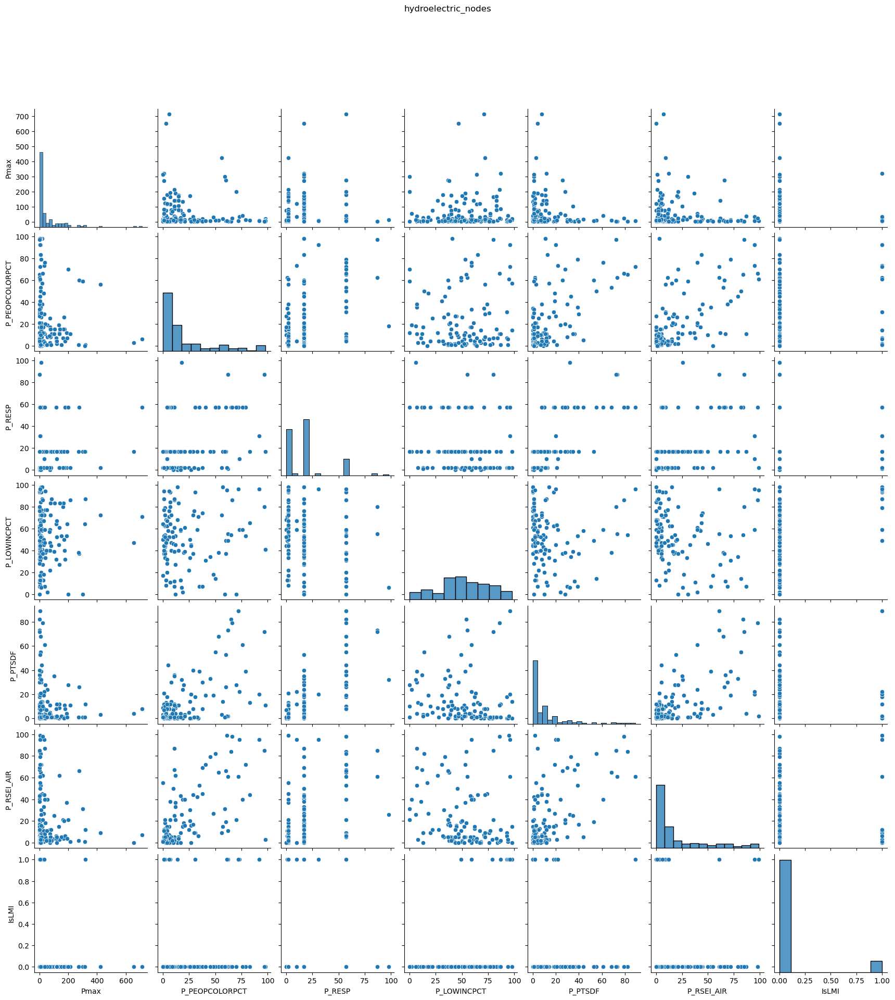

...

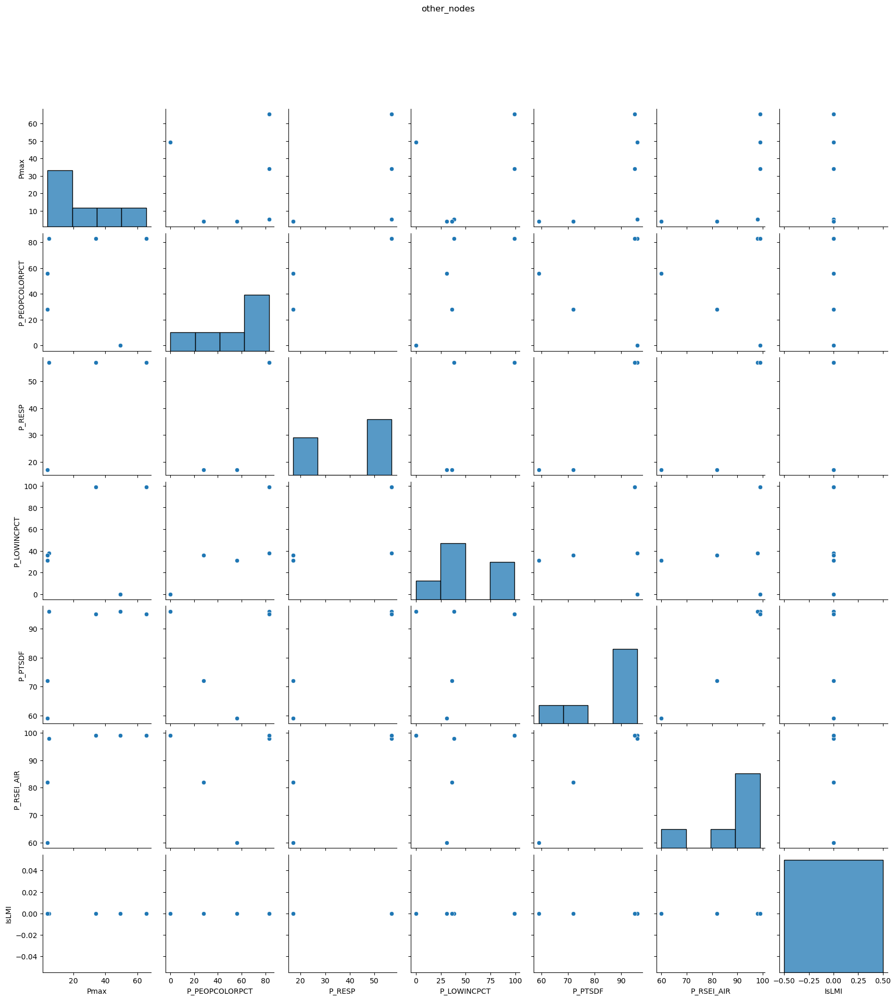

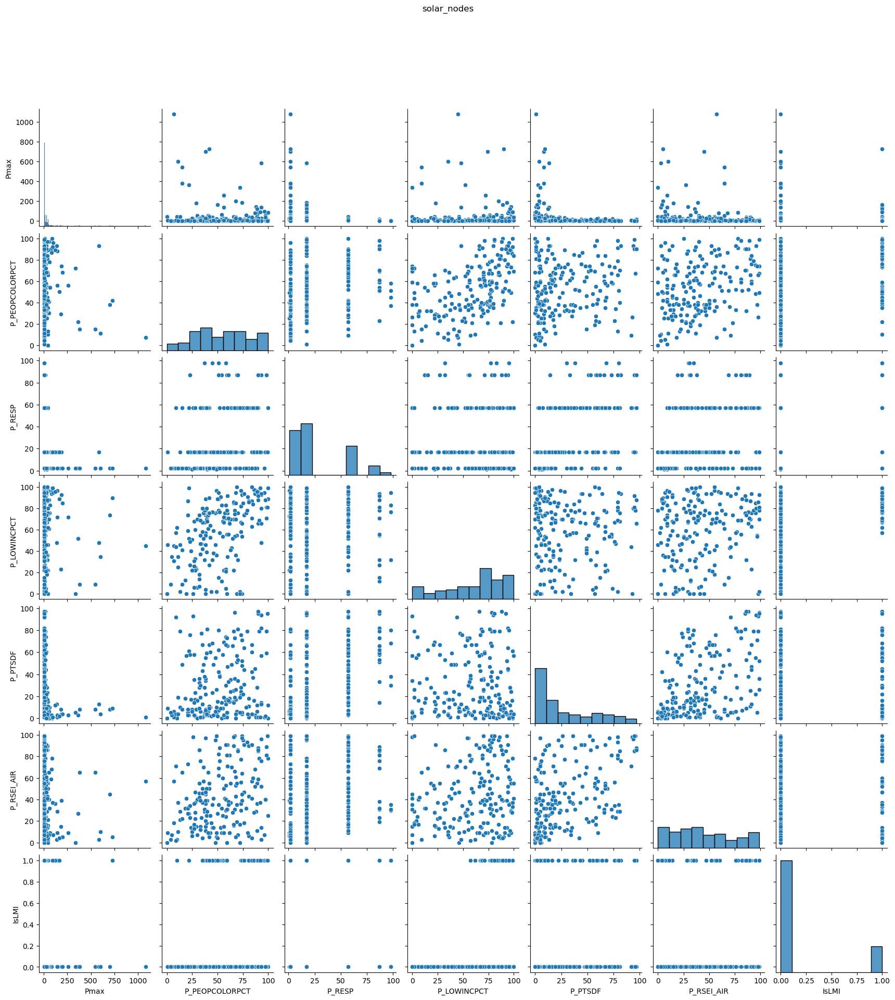

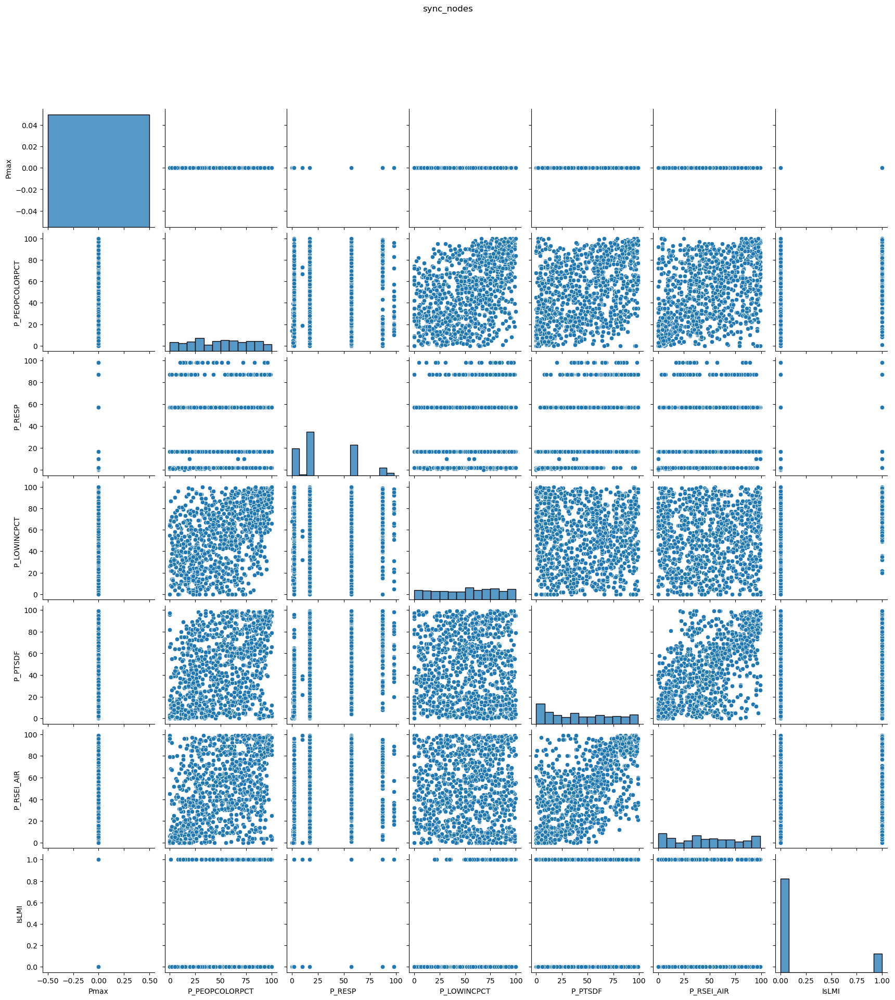

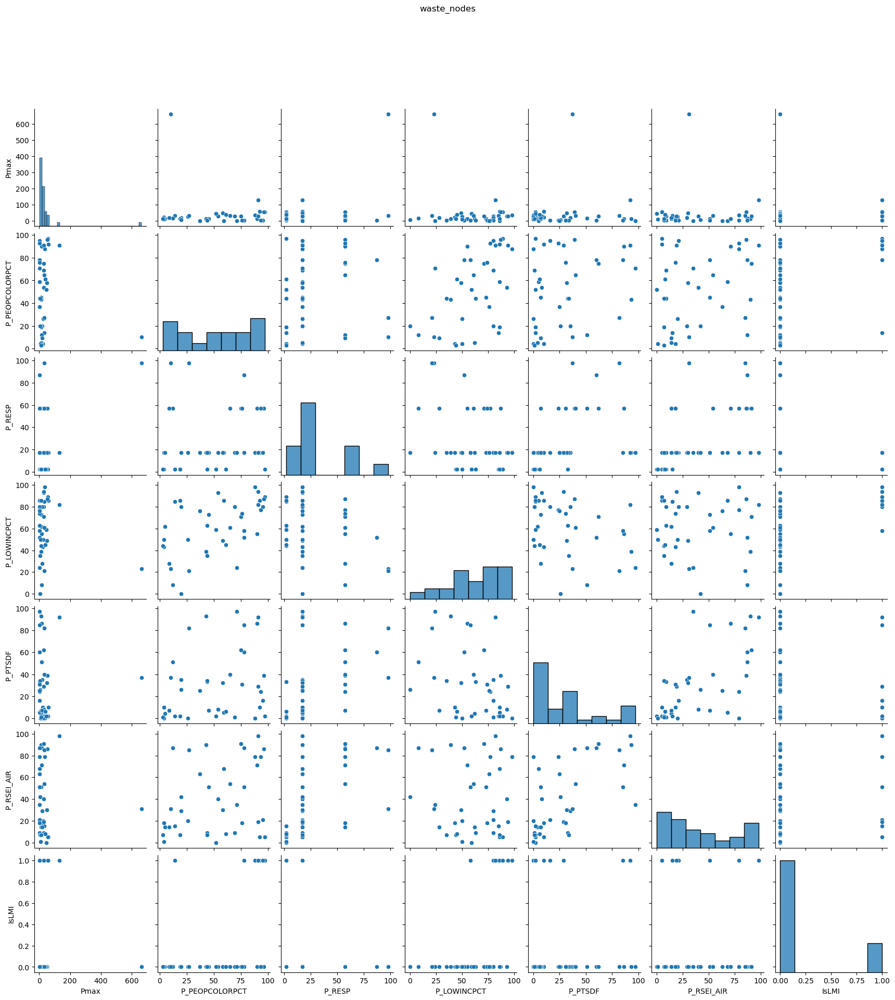

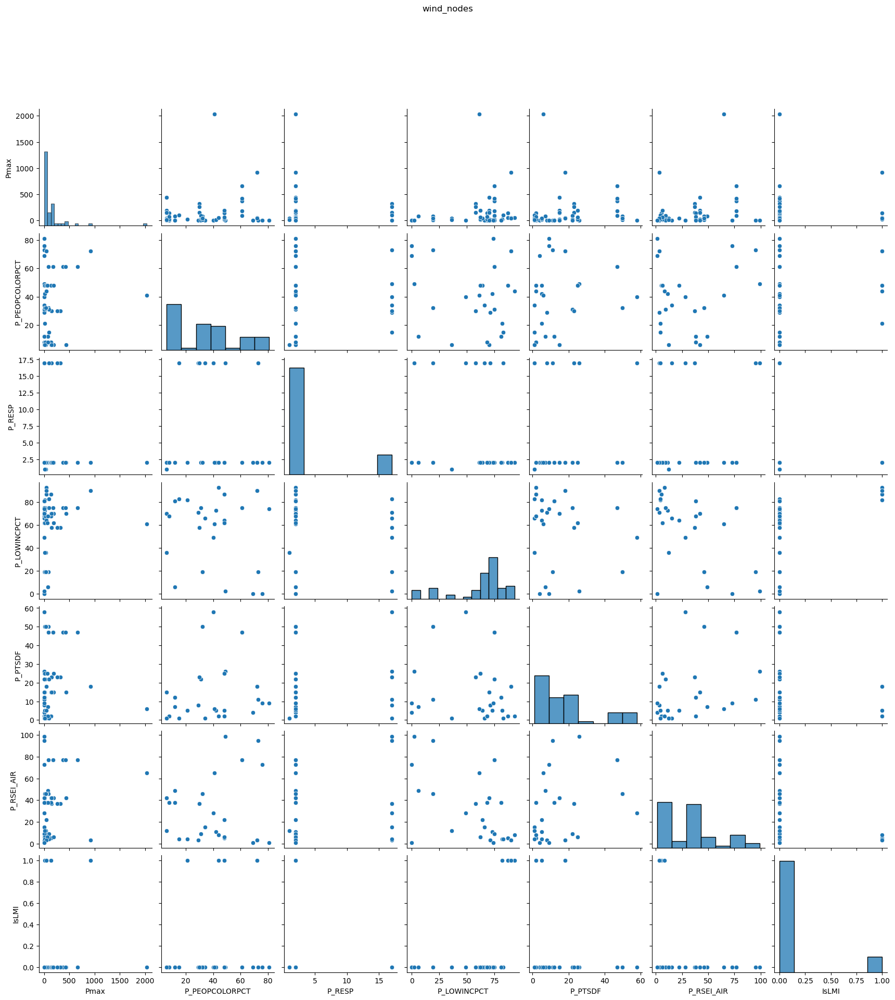

In [102]:
subset_columns = ['Pmax','P_PEOPCOLORPCT','P_RESP', 'P_LOWINCPCT', 'P_PTSDF','P_RSEI_AIR', 'IsLMI']
ej_metrics = ['P_PEOPCOLORPCT','P_LOWINCPCT','P_RESP','P_RSEI_AIR']

for key, df in generator_dict.items():
        # Plot pairplot
    sns.pairplot(df[subset_columns])
    plt.suptitle(f'{key}', y=1.1)
    plt.show()

## FF and RE

In [111]:
general_generator_dict['Fossil Fuel']['coal_nodes']['ACSTOTPOP']

bus
76      3972.0
1019    1897.0
Name: ACSTOTPOP, dtype: object

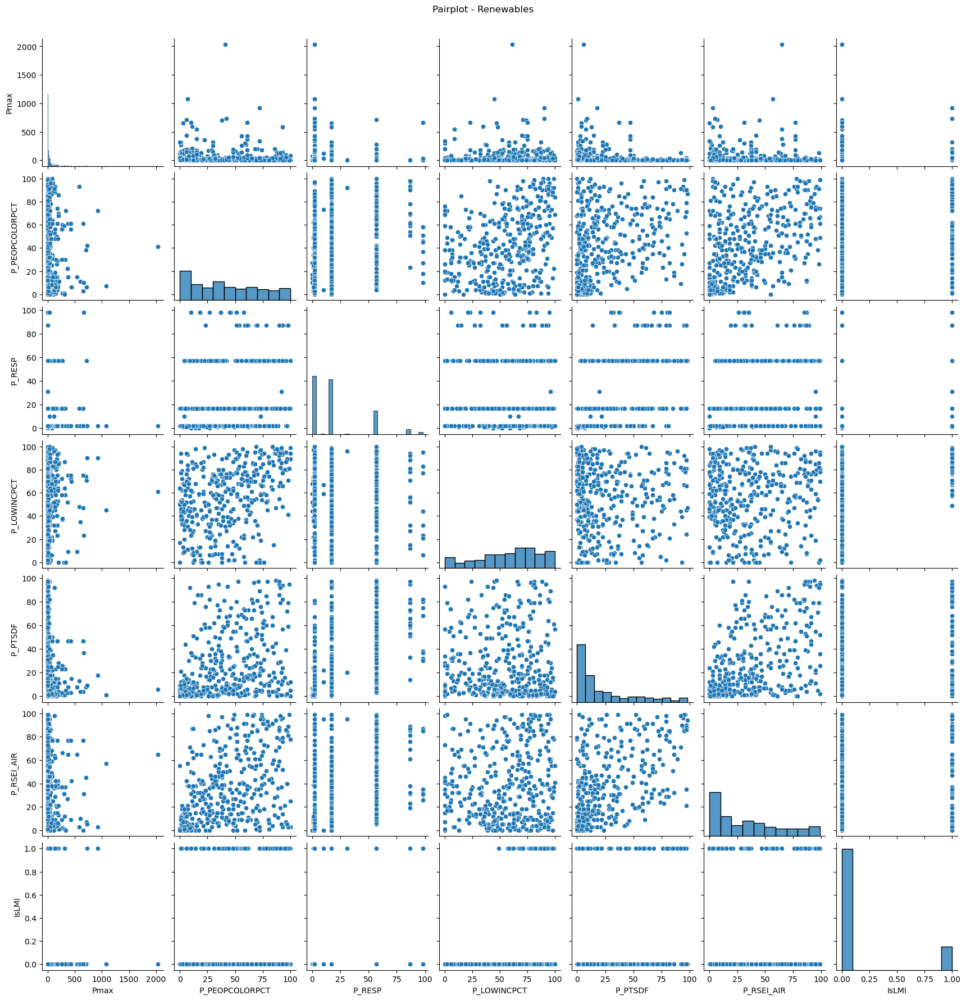

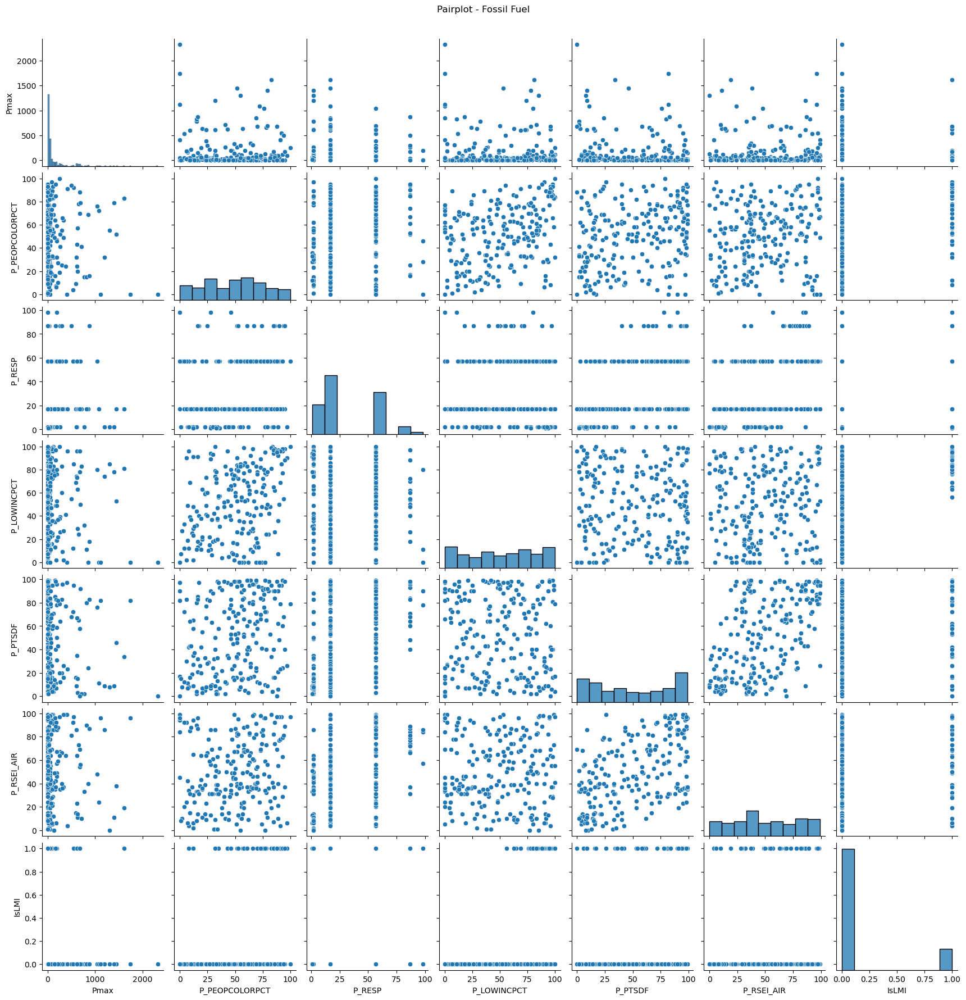

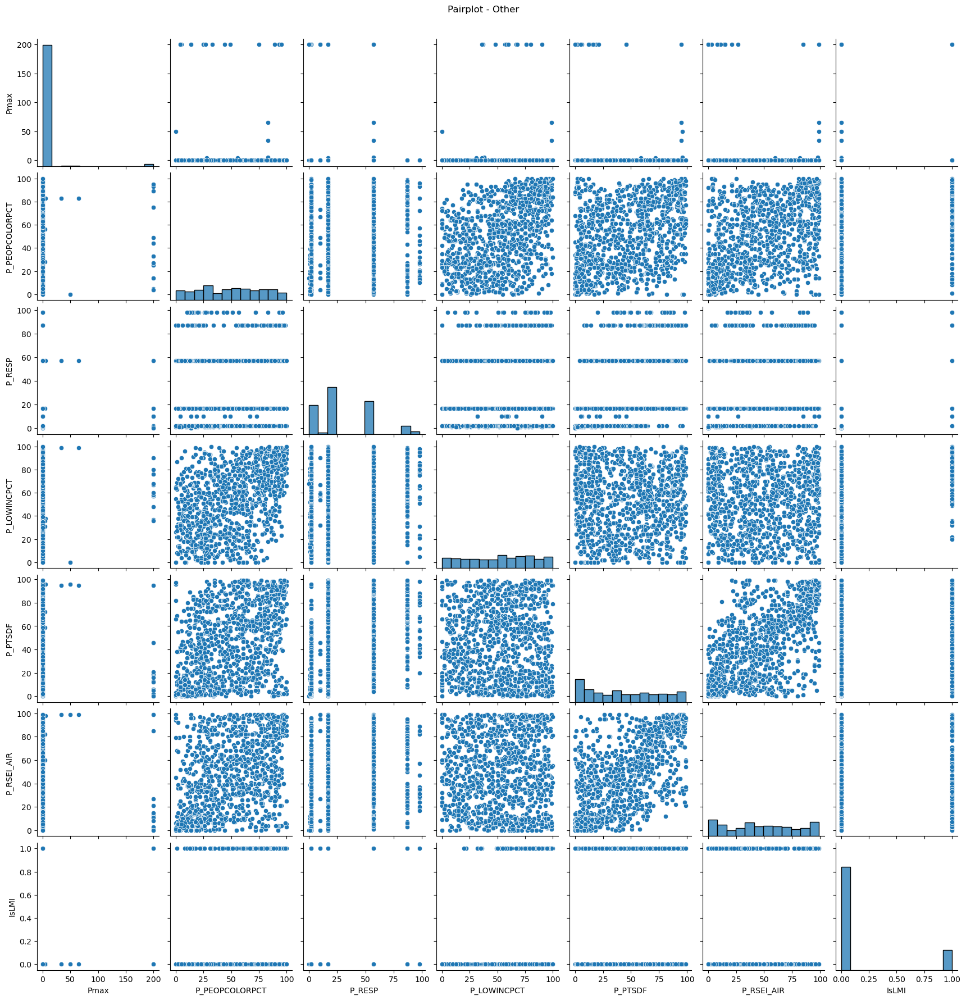

In [104]:
generator_mapping = {
    'Battery': 'Renewables',
    'Coal': 'Fossil Fuel',
    'Gas': 'Fossil Fuel',
    'Geothermal': 'Renewables',
    'Hydroelectric': 'Renewables',
    'IMPORT': 'Other',
    'Nuclear': 'Fossil Fuel',
    'Oil': 'Fossil Fuel',
    'Other': 'Other',
    'Solar': 'Renewables',
    'Sync': 'Other',
    'Waste': 'Renewables',
    'Wind': 'Renewables'
}
subset_columns = ['Pmax', 'P_LIFEEXPPCT', 'P_LOWINCPCT', 'P_PTSDF', 'IsLMI']
subset_columns = ['Pmax','P_PEOPCOLORPCT','P_RESP', 'P_LOWINCPCT', 'P_PTSDF','P_RSEI_AIR', 'IsLMI']

general_generator_dict = {}

general_generator_dict = {
    'Renewables': {},
    'Fossil Fuel': {},
    'Other': {}
}

# Loop through each generator type and categorize dataframes accordingly
for gen_type in generator_mapping:
    category = generator_mapping[gen_type]
    if category not in general_generator_dict:
        general_generator_dict[category] = {}
    general_generator_dict[category][gen_type.lower() + '_nodes'] = Gen_nodes[Gen_nodes[gen_type] > 0]
    
for key, df_dict in general_generator_dict.items():
    # Create an empty list to store dataframes from df_dict
    dfs = []
    
    # Extract dataframes from df_dict and append to dfs list
    for gen_type, df in df_dict.items():
        dfs.append(df[subset_columns])
    
    # Concatenate dataframes in dfs list along rows
    combined_df = pd.concat(dfs, axis=0)
    
    # Plot pairplot for the combined dataframe
    sns.pairplot(combined_df)
    plt.suptitle(f'Pairplot - {key}', y=1.02)
    plt.show()


In [33]:
def conditional_probability(df, column_a, value_a, column_b, value_b):
    # Filter DataFrame based on column B and its value
    subset_df = df[df[column_b] == value_b]

    # Calculate the probability of column A being value A given column B is value B
    count_a_given_b = subset_df[subset_df[column_a] == value_a][column_a].count()
    count_b = subset_df[column_b].count()

    # Check if denominator is not zero to avoid division by zero error
    if count_b != 0:
        probability = count_a_given_b / count_b
    else:
        probability = 0

    return probability

# Example usage:
# Assuming df is your DataFrame and column names are as described in your question
# For example, calculate P(Pmax > 50 | Coal = 1)
# prob = conditional_probability(Gen_nodes, 'Pmax', 50, 'Coal', 1)
# print(f"Probability of Pmax > 50 given Coal = 1: {prob}")


In [54]:
ej_metrics = ['P_PEOPCOLORPCT','P_LOWINCPCT','P_RESP','P_RSEI_AIR']

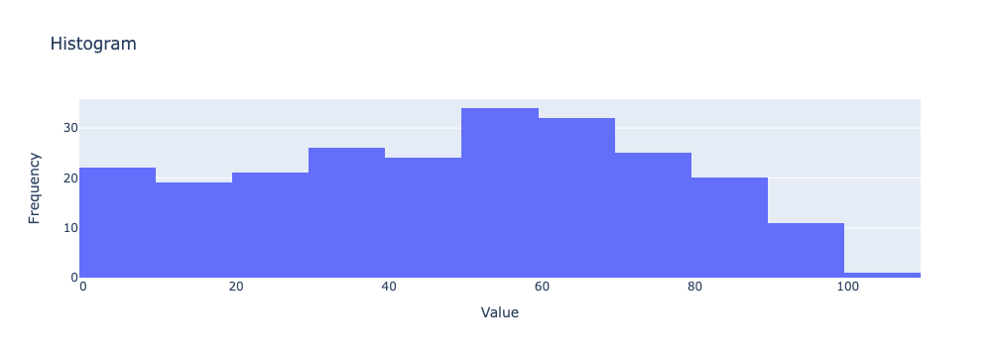

In [61]:
data = Gen_nodes[Gen_nodes['Gas']>0]

# Create the histogram
fig = go.Figure(data=[go.Histogram(x=data['P_PEOPCOLORPCT'])])
fig.update_layout(
    title='Histogram',
    xaxis_title='Value',
    yaxis_title='Frequency'
)

# Display the histogram
fig.show()

In [118]:
urb = shapefile_to_dataframe('/Users/melek/Downloads/tl_rd22_us_uac20.zip')

In [119]:
urb

,UACE20,GEOID20,NAME20,NAMELSAD20,LSAD20,MTFCC20,UATYP20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20
0,67240,67240,"Pampa, TX","Pampa, TX Urban Area",67,G3500,U,S,21374659,0,+35.5451610,-100.9656498
1,23230,23230,"Delta, CO","Delta, CO Urban Area",67,G3500,U,S,16126572,129608,+38.7454236,-108.0619343
2,36001,36001,"Gunnison, CO","Gunnison, CO Urban Area",67,G3500,U,S,9468678,11725,+38.5405505,-106.9384998
3,45775,45775,"Kuna, ID","Kuna, ID Urban Area",67,G3500,U,S,16384896,46009,+43.5010643,-116.4168990
4,05410,05410,"Basalt, CO","Basalt, CO Urban Area",67,G3500,U,S,9433311,68797,+39.3835983,-107.0807354
...,...,...,...,...,...,...,...,...,...,...,...,...
2640,74908,74908,"Ridgway, PA","Ridgway, PA Urban Area",67,G3500,U,S,6495687,98944,+41.4294622,-078.7380986
2641,96843,96843,"Wise--Norton, VA","Wise--Norton, VA Urban Area",67,G3500,U,S,28350106,95639,+36.9649058,-082.5955171
2642,88921,88921,"Tullahoma, TN","Tullahoma, TN Urban Area",67,G3500,U,S,38296270,0,+35.3697423,-086.2140939
2643,60502,60502,"Mount Washington, KY","Mount Washington, KY Urban Area",67,G3500,U,S,33680478,168692,+38.0411866,-085.5702925
